In [1]:
import numpy as np 
from matplotlib import pyplot as plt


In [2]:
def f(i,j): #функция для загрузки фотографий
    images = np.array([])
    img = plt.imread('attfaces\\s'+str(i)+'-'+str(j)+'.pgm')
    img = img.reshape((1, 10304))
    images = np.append(images,img)
    return images

In [3]:
images = [[f(i,j) for j in range(1,11)] for i in range(1,41)] #конструируем датасет с помощью верхней функции

In [4]:
images = np.array(images)#преобразование в numpy массив

In [5]:
images.shape#проверка размерности(40 человек, 10 фотографий у каждого, по 10304 пикселей на каждую фотографию)

(40, 10, 10304)

In [6]:
images = images.reshape((400, 10304))#из 3-х мерного тензора в двумерную матрицу

In [7]:
images.shape#проверка

(400, 10304)

In [8]:
Y = np.array([])#вектор меток
for i in range(1,41):# генерация вектора меток
    for j in range(1,11):#
         Y = np.append(Y,i)#
Y.shape

(400,)

In [9]:
X_valid = images[::5,::]#отделение изображение для валидации, как раз как и по заданию, получится по два изображения на валидацию и по 8 на обучение
Y_valid = Y[::5]#отделение меток

In [10]:
Y_valid.shape

(80,)

In [11]:
X_valid.shape

(80, 10304)

In [12]:
I = np.zeros(images.shape[0]) # отделение обучающей выборки
I[::5]=1
I1 = np.zeros(Y.shape)
I1[::5]=1
X_train = images[I!=1,:]
Y_train = Y[I1!=1] 

In [13]:
Y_train.shape

(320,)

In [14]:
X_train.shape

(320, 10304)

In [15]:
avg = np.sum(X_train, axis=0)/X_train.shape[0]#попиксельно складываем и делим на размерность, получаем вектор пикселей "среднего лица"

In [16]:
avg.shape

(10304,)

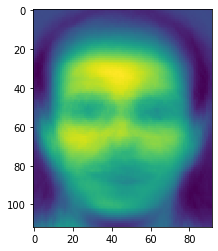

In [17]:
b = avg.reshape(112, -1)#преобразование обратно в матрицу
plt.imshow(b)#отрисовка среднего лица

In [18]:
F = X_train - avg #отцентрирование выборки

In [19]:
F.shape

(320, 10304)

In [20]:
C = np.cov(F) #матрица ковариации

In [21]:
C.shape

(320, 320)

In [22]:
s, v, d = np.linalg.svd(C) #сингулярное разложение SVD

In [23]:
v.shape

(320,)

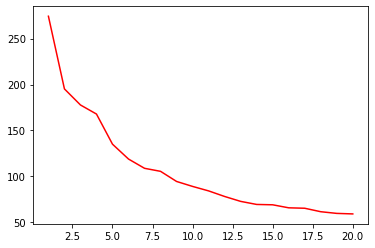

In [24]:
fig, ax = plt.subplots() #
v = v**(1/2) #т.к сингулярные числа изначальна даются в квадрате
ax.plot([i for i in range(1,21)], v[:20], 'r-', linestyle='solid')# отрисовка сингулярных чисел для поиска каменной осыпи
plt.show()

In [25]:
V = np.array([i for i in v if i > np.sum(v)/320])#определяем кол-во компонент методом кайзера 

In [26]:
A = V.shape[0]# итог метода кайзера

In [27]:
V

array([274.3698978 , 195.25625481, 177.77906069, 167.88872192,
       135.08797123, 118.90378159, 108.82364486, 105.52853825,
        94.5013831 ,  89.10371571,  84.22694676,  78.15746314,
        72.8178184 ,  69.47795794,  69.09459816,  65.81246692,
        65.34075564,  61.56576174,  59.73773289,  59.16864336,
        58.78249168,  55.86924981,  54.31089664,  52.05584094,
        51.44619645,  49.88418039,  49.23512888,  48.5706306 ,
        47.528225  ,  46.97143883,  45.75795303,  45.20698807,
        43.91246449,  43.0569154 ,  42.26723203,  42.16281623,
        41.3075352 ,  40.96181334,  40.20036419,  39.60430842,
        39.00417266,  38.42486934,  38.01955371,  37.48235748,
        37.40718081,  36.52635095,  35.98877695,  35.33848918,
        34.91713402,  34.78926916,  34.0198607 ,  33.8257813 ,
        33.53479919,  33.23142793,  33.10045663,  32.48615276,
        32.27687536,  32.09061114,  31.89428543,  31.32336642,
        31.15418401,  30.40267286,  29.9861597 ,  29.89

In [28]:
u = F.T.dot(s)# F транспонированное на s-собственные вектора

In [29]:
u.shape

(10304, 320)

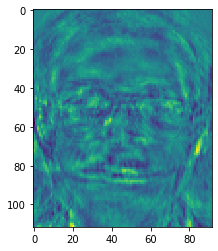

In [30]:
b = u[:,110].reshape(112, -1)#отрисовка "собственного лица",можно задать любое из выборки
b.shape
plt.imshow(b)

In [31]:
P = u[:,:A]#выделяем количество главных компонент по методу кайзера

In [32]:
P.shape

(10304, 86)

In [33]:
F.shape

(320, 10304)

In [34]:
Fnew = F.dot(P)#образы обектов в пространстве главных компонент

In [35]:
Fnew.shape

(320, 86)

In [36]:
def evd(objects,obj):#евклидова метрика
    return (np.sum((objects - obj)**2, axis=1))**(0.5) 

In [37]:
maxRange = np.zeros([40])#поиск порого похожести
p=0
for i in range(0,40):
    for j in range(0,8):
        val = np.max(evd(Fnew[p:p+8,:],Fnew[j,:]))
        if(maxRange[i] < val):
            maxRange[i] = val
    p=p+8

In [38]:
p=np.max(maxRange)

In [39]:
F1 = X_valid - avg
F_valid = F1.dot(P)  

In [40]:
F_valid.shape

(80, 86)

In [41]:
def predict(X,Y,k): #предсказывает и сразу даёт оценку предсказаниям, предсказания даются по л ближайшим значениям
    predictions = np.zeros([X.shape[0]])
    elem_close = np.zeros([X.shape[0],k])
    ranges = np.zeros([X.shape[0],k])
    args = np.array([[i for i in range(0,Fnew.shape[0])]])
    for i in range(0,X.shape[0]):
        pr=evd(Fnew,X[i,:])
        t=np.append(np.array([pr]),np.array([Y_train]),axis=0)
        t=np.append(t,args,axis=0).T
        t=t[np.argsort(t[:, 0])]
        pred = t[:k,1]
        elem_close[i] = t[:k,2].T
        ranges[i] = t[:k,0].T
        elements, repeats = np.unique(pred, return_counts=True)
        index = repeats.argmax()
        elem = elements[index]
        predictions[i] = elem
    truePred = Y - predictions
    return (np.count_nonzero(truePred)/X.shape[0],elem_close,ranges)# возвращает оценку качества, индексы ближайших элементов, а так же асстояние до них

In [42]:
C,E,R = predict(F_valid,Y_valid,5)
print(1-C)

0.825


In [43]:
def pl(j):# функция, которая отрисовывает элементы и ближайшие до них, а так же помечает "good" те, расстояние до которых не привышает порога "p"
    plt.figure(figsize=(3,3))
    e = X_valid[j,:].T
    b = e.reshape(112, -1)
    plt.imshow(b)
    plt.figure(figsize=(10,10))
    for i in range(5):
        plt.subplot(1,5,i+1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        e = X_train[int(E[j,i]),:].T
        b = e.reshape(112, -1)
        plt.imshow(b)
        if(R[j,i] < p):
            plt.xlabel("good")
        else:
            plt.xlabel("bad")
    plt.show()
    

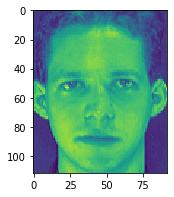

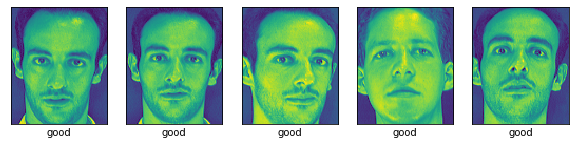

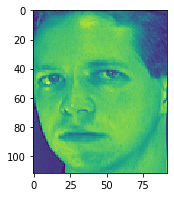

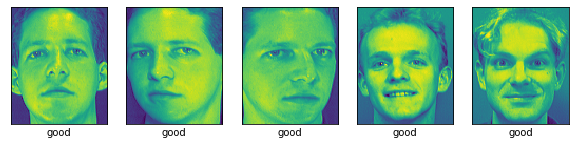

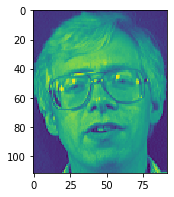

...

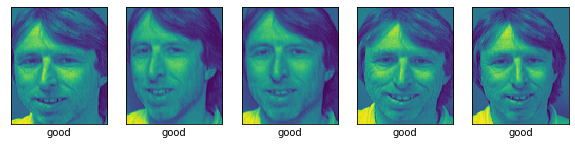

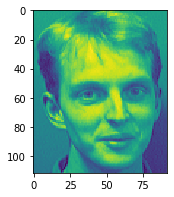

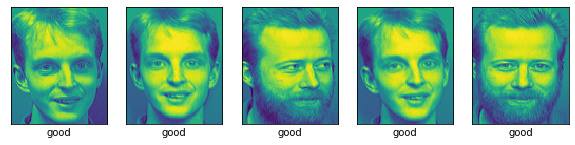

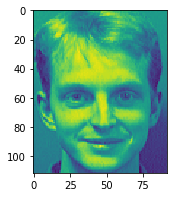

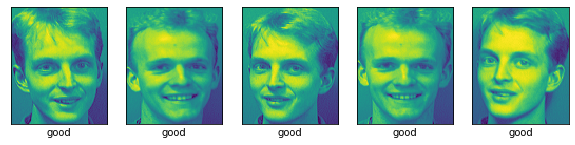

In [44]:
for i in range(80):
    pl(i)